# Step One Subject Tracking 
## Where the fuck is the subject tracking program?
- Doesn't seem like the subject tracking program is actually in the repository
- Let's try to use facebooks detectron2 to do this then. 

### Vanilla off the shelf tracking

In [1]:
import torch 

In [2]:
torch.cuda.is_available()

True

In [1]:
from detectron2.config import get_cfg
from detectron2.data.detection_utils import read_image
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
setup_logger()
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import os 

In [2]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESHOLD = .7
predictor = DefaultPredictor(cfg)

In [ ]:
cfg.MODEL.WEIGHTS

'https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl'

In [ ]:
cap = cv2.VideoCapture('Bern_2021/double_touch/BARDENET_FRA_vs_CANNONE_FRA_dt_1_1.avi')
_, frame = cap.read()


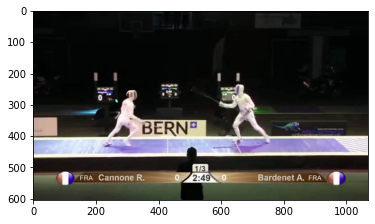

In [ ]:
plt.imshow(frame)

In [ ]:
outputs = predictor(frame)

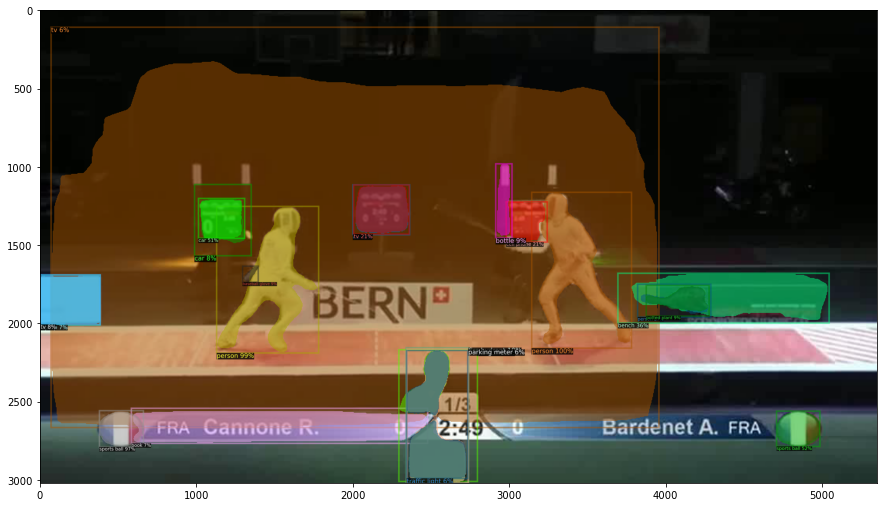

In [ ]:
v = Visualizer(frame[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=5)
out=v.draw_instance_predictions(outputs['instances'].to("cpu"))
plt.figure(figsize=(15,20))
plt.imshow(out.get_image())


Not bad at all, let's see how the out of the box model performs over an entire video clip

In [3]:

def detection_on_video(video, max_frames, metadata):

    v = VideoVisualizer(metadata, ColorMode.IMAGE)
    readFrames = 0
    while video.isOpened():
        has_frame, img = video.read()
        if not has_frame:
            break
        out = predictor(img)
        viz = v.draw_instance_predictions(img, out["instances"].to("cpu"))
        viz = viz.get_image()#cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)
        yield viz
        readFrames += 1
        if readFrames > max_frames:
            break
        


In [27]:
def record_vis(video_in, video_out, metadata):
    video = cv2.VideoCapture(video_in)
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))//2.5
    video_writer = cv2.VideoWriter(video_out + '.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

    for visualization in tqdm(detection_on_video(video, num_frames, metadata), total=num_frames):
        video_writer.write(visualization)
    video.release()
    video_writer.release()
    cv2.destroyAllWindows()

Some observations:
- High Confidence detections when fencers are mostly upright 
- during sport specific movements detections fall apart

If we create a new data set of fencers performing actions we should hopefully be able to adapt this algorithm to our sport specific domain


In [5]:
from roboflow import Roboflow

ModuleNotFoundError: No module named 'roboflow'

In [7]:
!pip install roboflow


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\liamc\\anaconda3\\envs\\fencing_v3\\Lib\\site-packages\\cv2\\cv2.pyd'
Consider using the `--user` option or check the permissions.




  Using cached roboflow-0.2.4-py3-none-any.whl
  Using cached opencv_python-4.5.5.64-cp36-abi3-win_amd64.whl (35.4 MB)
  Using cached chardet-4.0.0-py2.py3-none-any.whl (178 kB)
  Using cached pyparsing-2.4.7-py2.py3-none-any.whl (67 kB)
  Using cached certifi-2021.5.30-py2.py3-none-any.whl (145 kB)
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.4
    Uninstalling pyparsing-3.0.4:
      Successfully uninstalled pyparsing-3.0.4
  Attempting uninstall: certifi
    Found existing installation: certifi 2021.10.8
    Uninstalling certifi-2021.10.8:
      Successfully uninstalled certifi-2021.10.8


In [6]:
from roboflow import Roboflow

rf = Roboflow(api_key="RGBu6mpwxafQy01EofPO")
project = rf.workspace("liam-carpenter").project("fencer-detection")
dataset = project.version(7).download("coco")

ModuleNotFoundError: No module named 'roboflow'

In [8]:
import json
import random
path = "Fencer-Detection-7/train"

In [9]:
from detectron2.structures import BoxMode
def json_to_dict(img_dir):
		
	json_file = os.path.join(img_dir, "_annotations.coco.json")
	with open(json_file) as f:
			img_anns = json.load(f)
	dataset_dicts = []
	curr_ann_pos = 0
	anns = img_anns['annotations']
	num_anns = len(anns)
	for im in img_anns['images']:
		record = {}
		filename = os.path.join(img_dir, im['file_name'])
		record['file_name'] = filename
		record['image_id'] = im['id']
		record["height"] = im['height']
		record['width'] = im['width']
		in_image = True
		objs = []

		while in_image:
			curr_ann = anns[curr_ann_pos] 
			cat = curr_ann

			obj = {
					'bbox':curr_ann['bbox'],
					'bbox_mode': BoxMode.XYWH_ABS,
					'segmentation':[],
					'category_id': curr_ann['category_id'] - 1,
			}
			objs.append(obj)
			if curr_ann_pos < num_anns-1:
				curr_ann_pos += 1  
			else: break
			im_id = anns[curr_ann_pos]['image_id']
			if im_id != im['id']:
				in_image = False
			
		record["annotations"] = objs
		dataset_dicts.append(record)
	return dataset_dicts



In [10]:
for d in ["train", "valid"]:
    DatasetCatalog.register("fencing_" + d, lambda d=d: json_to_dict("Fencer-Detection-7/" + d))
    MetadataCatalog.get("fencing_" + d).set(thing_classes=[ "crowd", "fencer", "referee"])
fencing_metadata = MetadataCatalog.get("fencing_train")

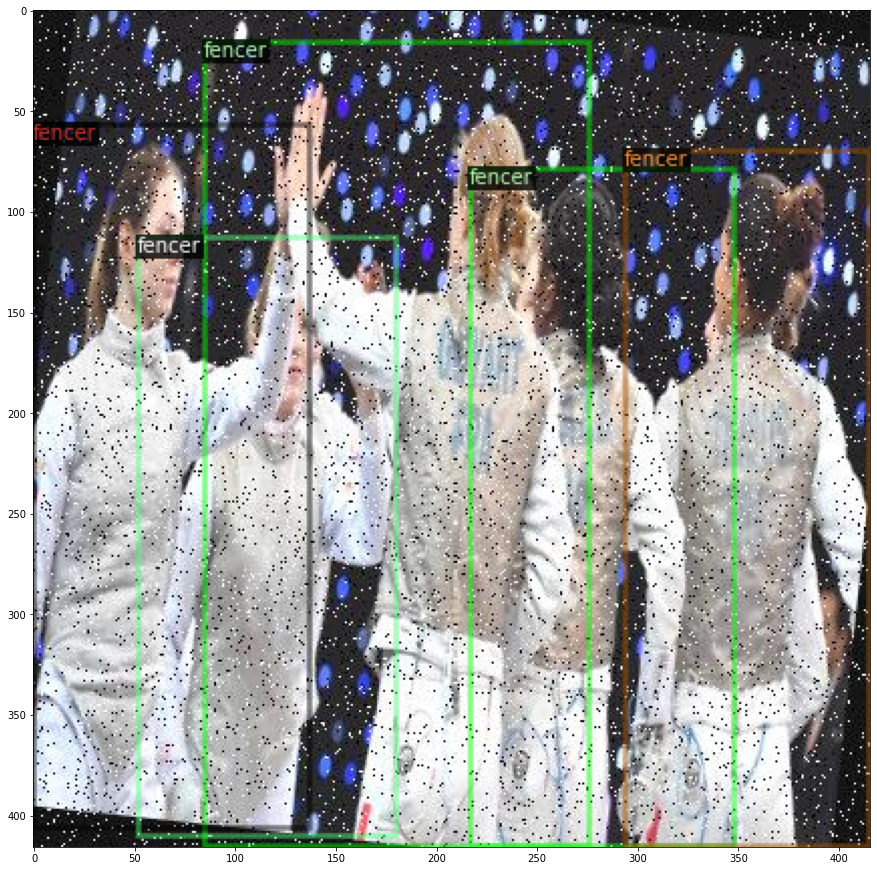

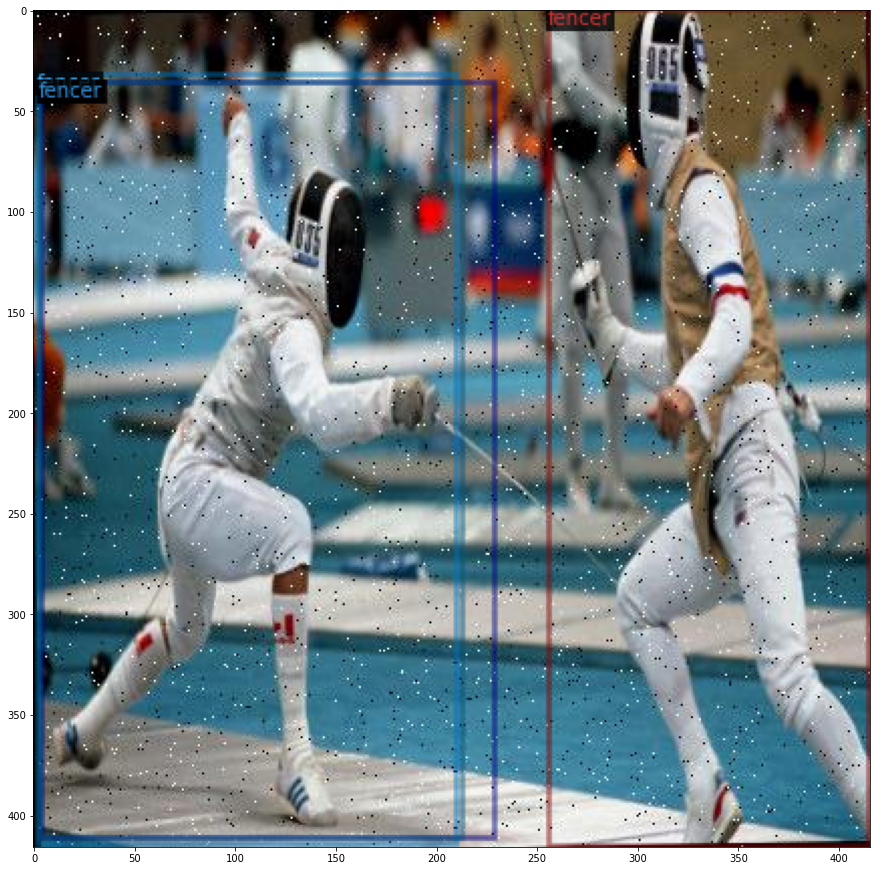

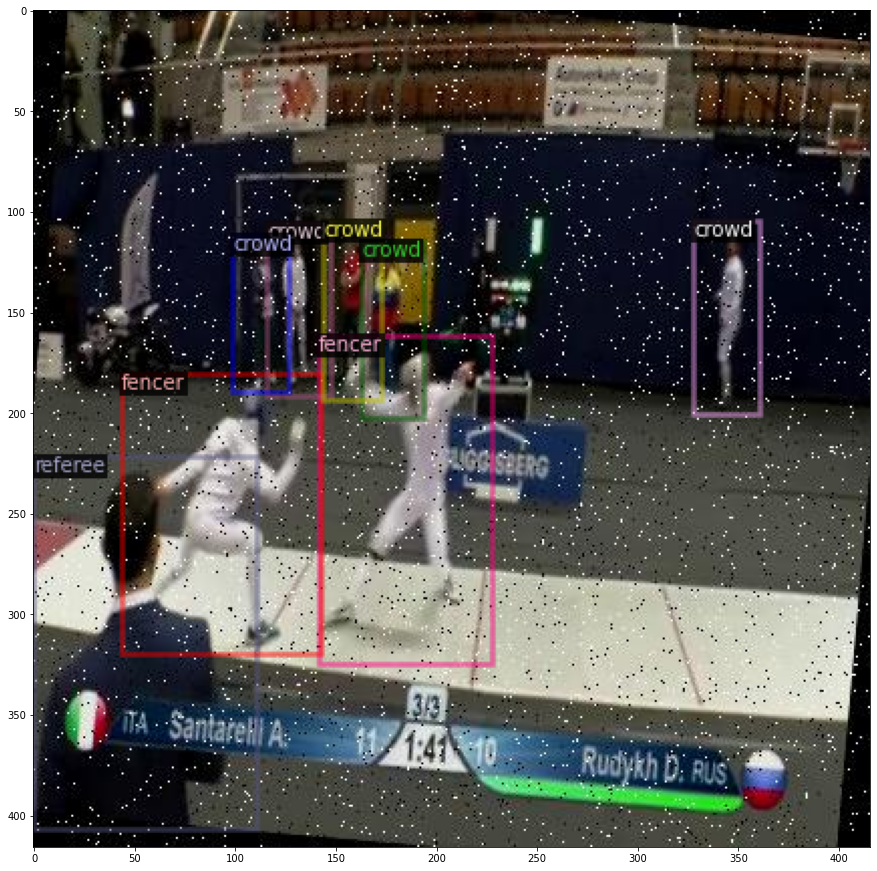

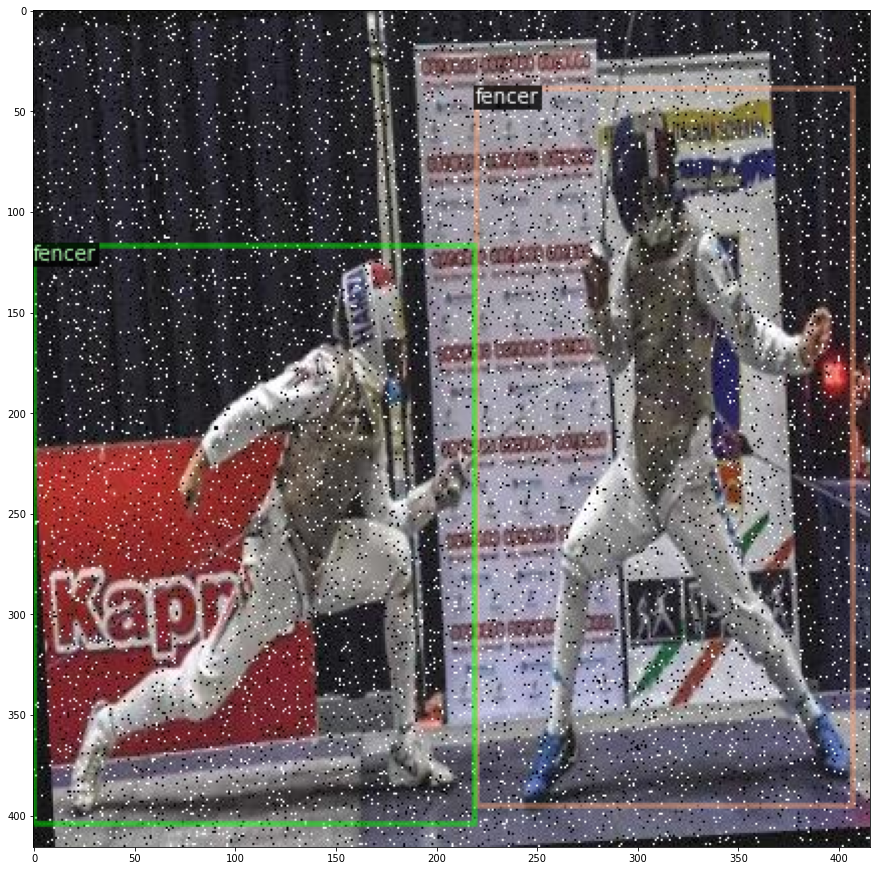

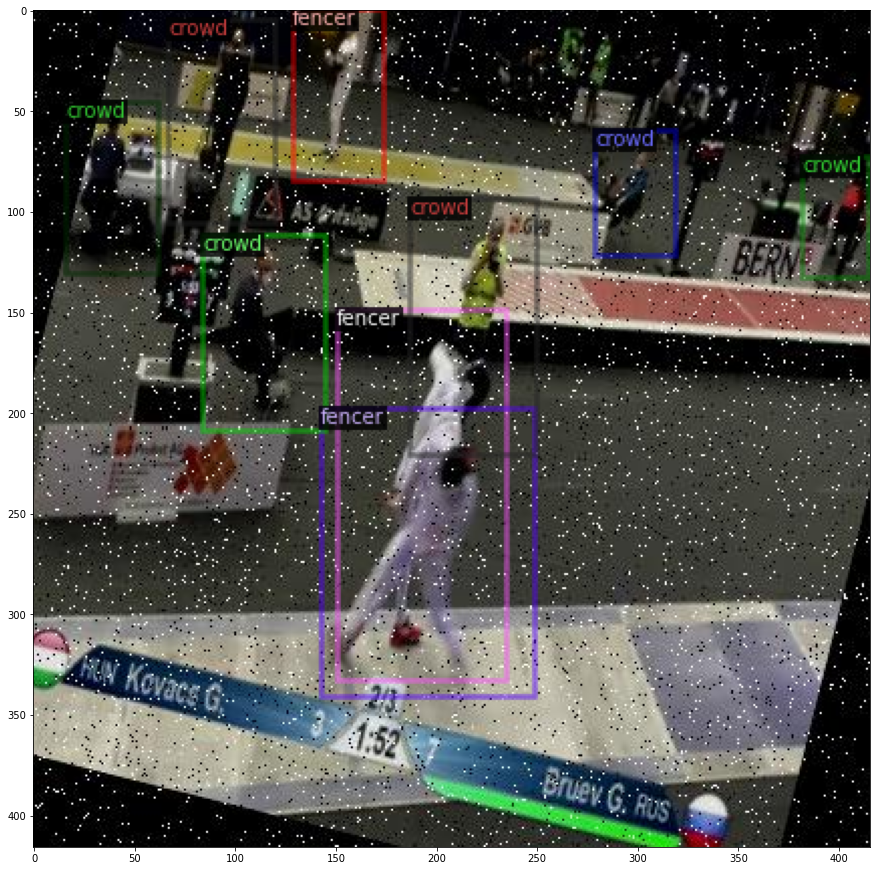

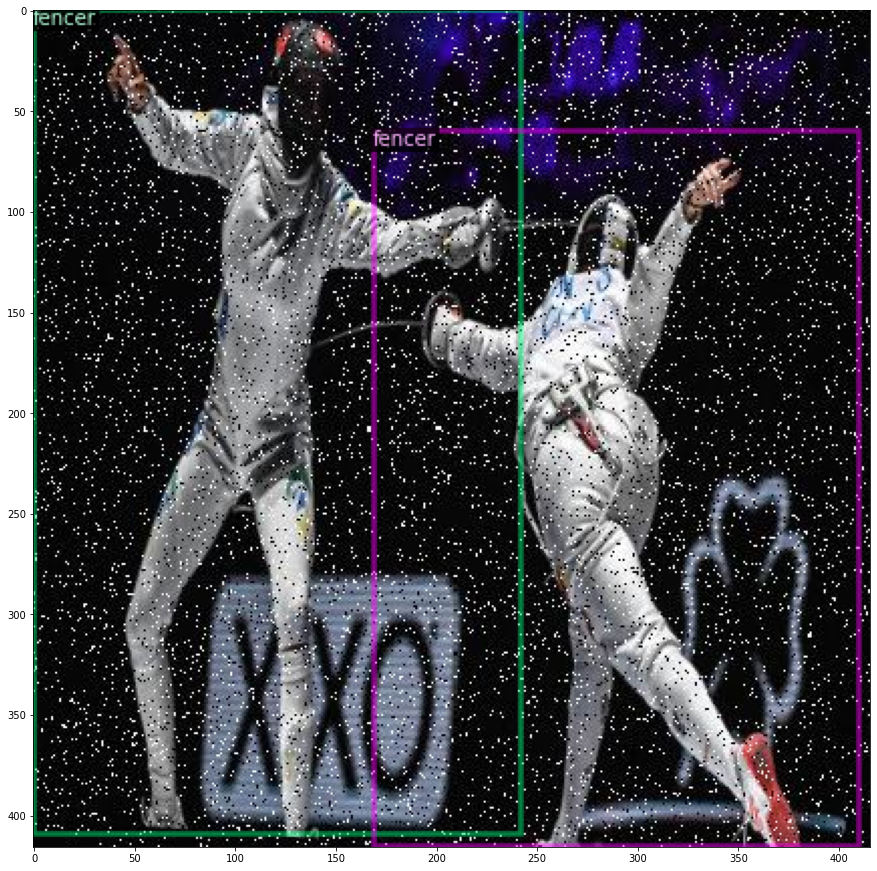

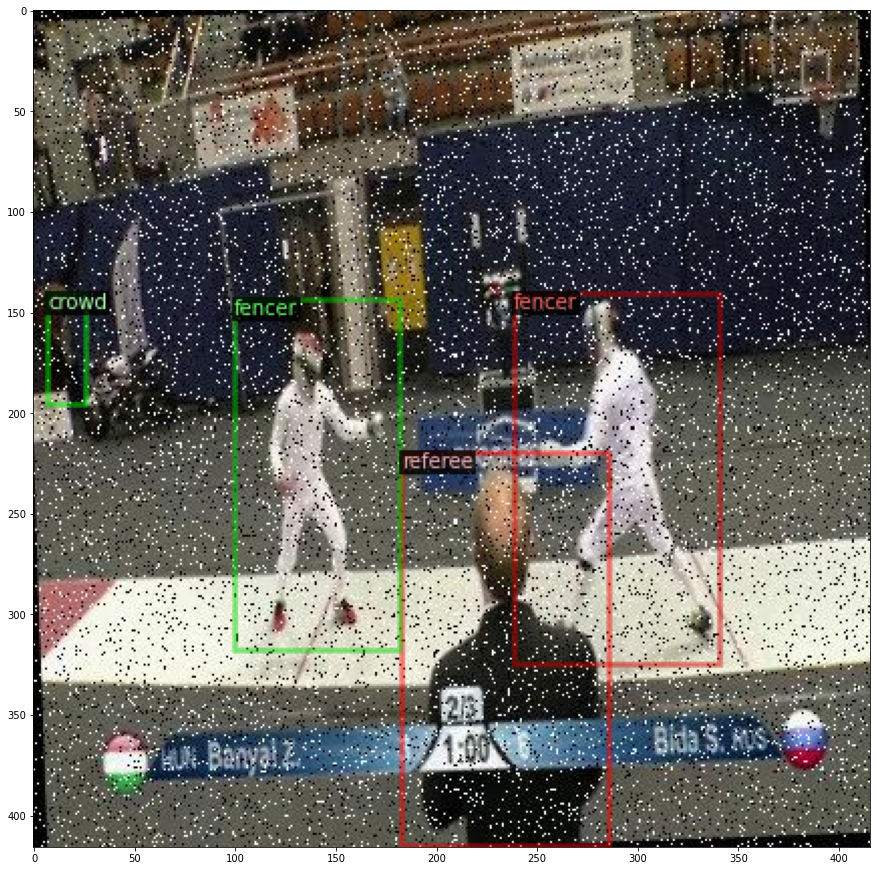

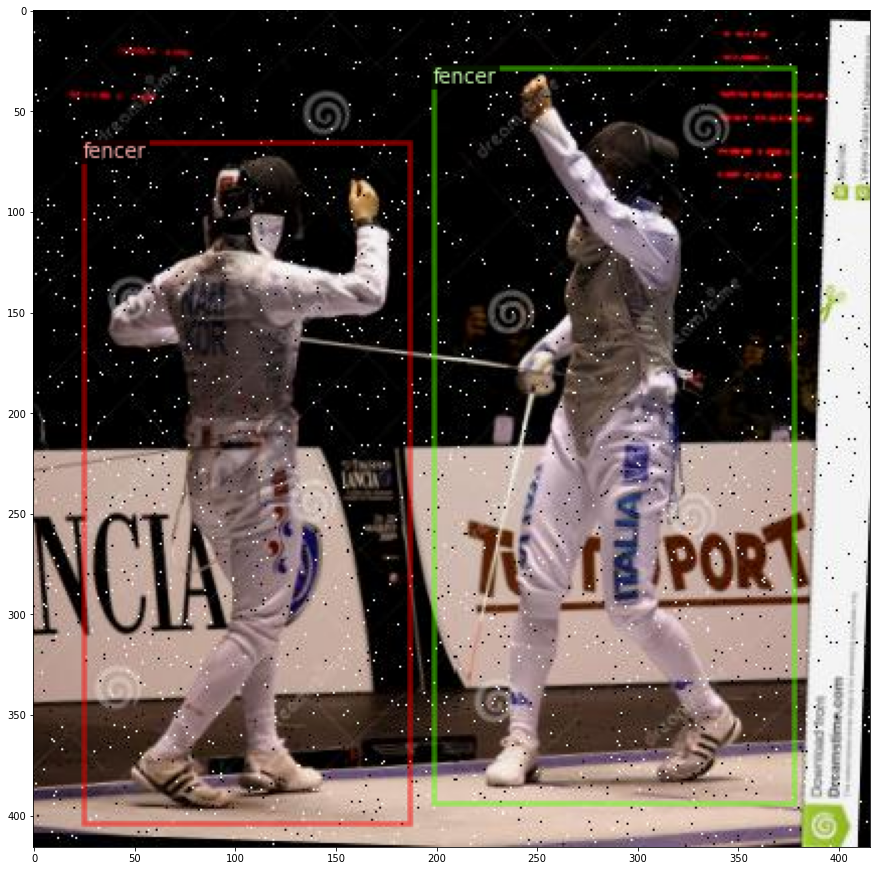

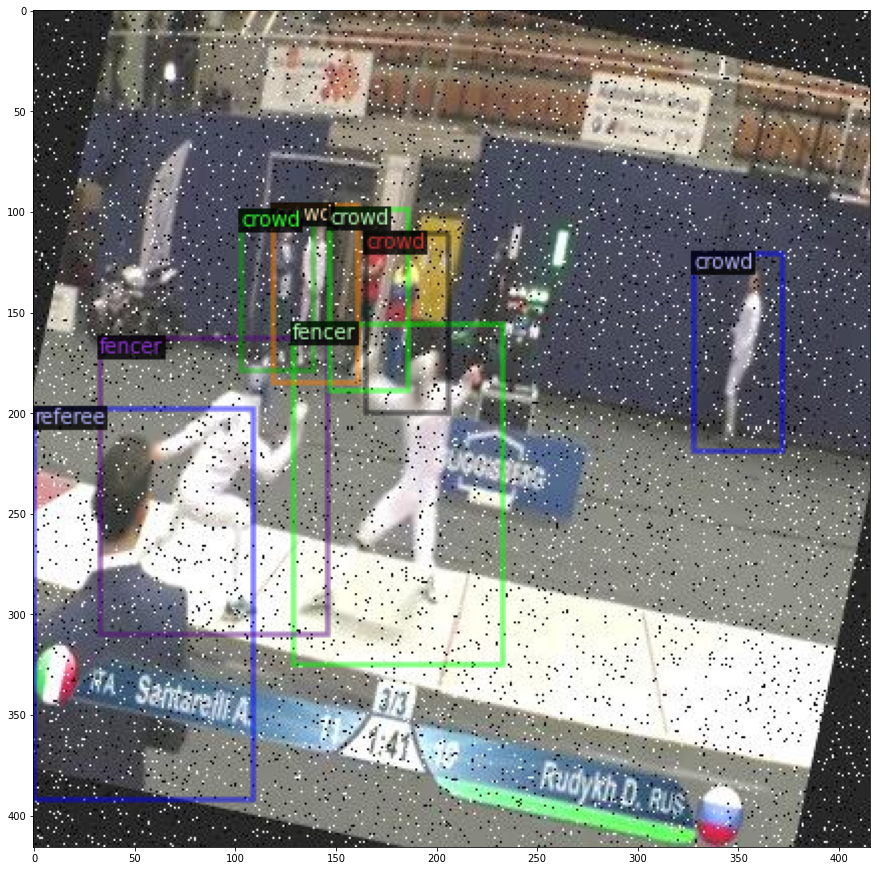

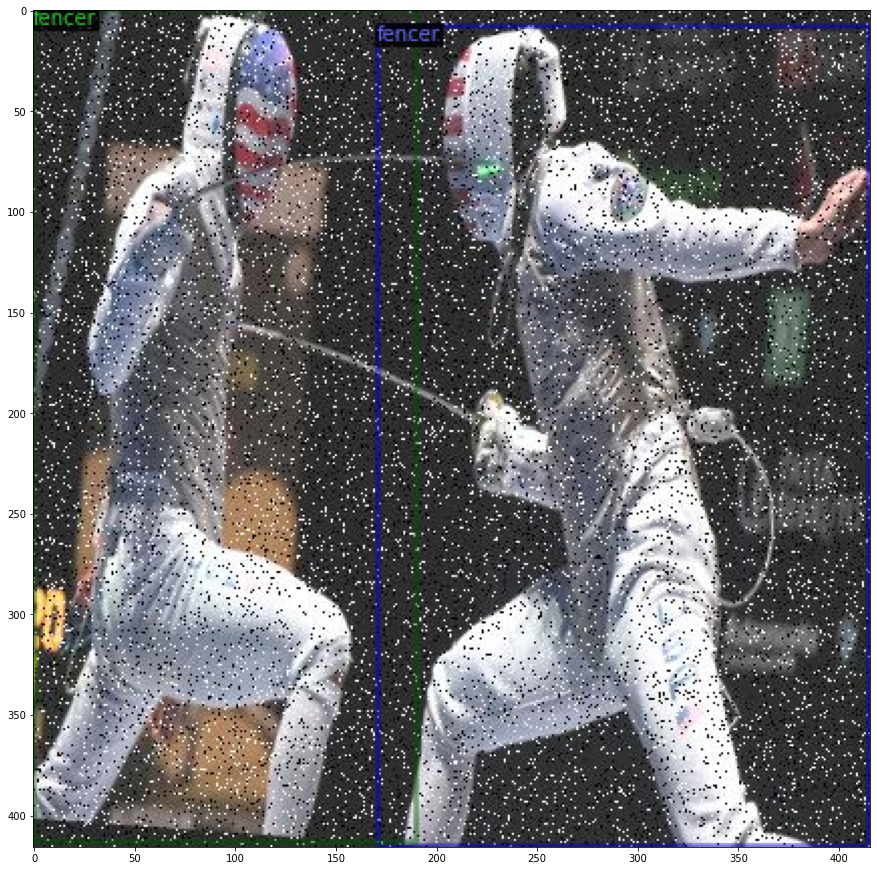

In [13]:
dataset_dicts = json_to_dict("C:\\Users\\liamc\Desktop\\fencing_vision\src\\vpd_fencing\\data\\fencing\\Fencer-Detection-7\\train")
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fencing_metadata)
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(15, 20))
    plt.imshow(out.get_image())

In [23]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fencing_train",)
cfg.DATASETS.VALID = ("fencing_valid", )
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
# #

# os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# trainer = DefaultTrainer(cfg) 
# trainer.resume_or_load(resume=False)
# trainer.train()

In [24]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.OUTPUT_DIR = 'C:\\Users\\liamc\\Desktop\\fencing_vision\\src\\vpd_fencing\\output\\'
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "referee_crowd_fencer.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

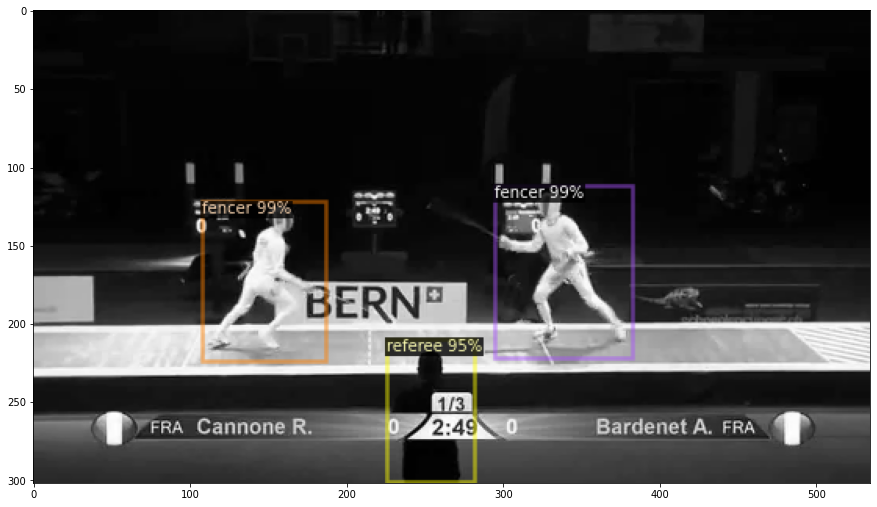

In [25]:
cap = cv2.VideoCapture("C:\\Users\\liamc\\Desktop\\fencing_vision\\data\\clips\\BARDENET_FRA_vs_CANNONE_FRA__1_left.mp4")
_, frame = cap.read()
outputs = predictor(frame)
v = Visualizer(frame, metadata = fencing_metadata, scale =.5, instance_mode = ColorMode.IMAGE_BW)
out= v.draw_instance_predictions(outputs['instances'].to("cpu"))
plt.figure(figsize=(15, 20))
plt.imshow(out.get_image())

In [25]:
instances = outputs['instances']
instances = instances[instances.pred_classes == 1]

In [30]:
instances.get_fields()['pred_boxes']

Boxes(tensor([[221.2496, 243.4441, 375.8888, 446.5192],
        [576.7817, 221.1548, 770.0580, 443.3638]], device='cuda:0'))

In [ ]:
from detectron2.structures.boxes import Boxes

In [ ]:

mytup = (1, 2, 3, 4)
Boxes(np.array(mytup).reshape(1, -1))

Boxes(tensor([[1., 2., 3., 4.]]))

In [28]:
#video_in, video_out, metadat
record_vis("C:\\Users\\liamc\\Desktop\\fencing_vision\\data\\clips\\BARDENET_FRA_vs_CANNONE_FRA__1_left.mp4", "Bardenet_Cannone", fencing_metadata)

65it [00:17,  3.64it/s]                          


Ok. We have a solid object detection model right now. Some things that need to be worked on and improved 
- Train on fencers in difficult positions(close to each other, passing each other, infighting ...) 
- Improve touch save. It seems to work right about 70% of the time, don't technically need it to be working 100% of the time to do the training, can just select good videos... Might introduce some bias into the dataset... Don't know what the common theme is between these clips that aren't saving correctly. 

In terms of of overall structure of the project, and this notebook, the next thing we need to do is use this detection to create our data input files for the student teacher network. 

Probably will make my life easier to get a high quality touch saver first. We should probably clean up these repos before anything else though.

In [32]:
import torch

In [33]:
my_list = [torch.Tensor([4, 5, 6]),torch.Tensor([1, 2, 3])]

In [43]:
tensor = torch.Tensor([0.0000, 0.0000, 0.0112])
len(torch.where(tensor>.3)[0])

0

In [54]:
not (False or True)

False

# Step Two Pose Estimation 

In [23]:
from mim import download
import os
import json 
from mmpose.apis import inference_top_down_pose_model, init_pose_model, vis_pose_result
from mmcv import Config
from configparser import ConfigParser
import cv2
import gzip
import matplotlib.pyplot as plt

In [1]:
import os

In [2]:
os.cpu_count()

16

In [4]:
%cd ..

c:\Users\liamc\Desktop\fencing_vision


In [20]:
download('mmpose', ['topdown_heatmap_litehrnet_30_coco_384x288'], dest_root= './pose_estimation')

processing topdown_heatmap_litehrnet_30_coco_384x288...
Successfully downloaded litehrnet30_coco_384x288-a3aef5c4_20210626.pth to c:\Users\liamc\Desktop\fencing_vision\pose_estimation
Successfully dumped topdown_heatmap_litehrnet_30_coco_384x288.py to c:\Users\liamc\Desktop\fencing_vision\pose_estimation


['litehrnet30_coco_384x288-a3aef5c4_20210626.pth']

In [5]:
checkpnt = '.\pose_estimation\litehrnet30_coco_384x288-a3aef5c4_20210626.pth'
config = '.\pose_estimation\\topdown_heatmap_litehrnet_30_coco_384x288.py'

In [6]:
img_path = 'Bern_2021\\clips\BARDENET_FRA_vs_CANNONE_FRA__1.avi'
basename = os.path.basename(img_path).split('.')[0]
boxes_path = f'Bern_2021\\2d_pose\{basename}'

In [7]:
with open(os.path.join(boxes_path, 'left\\boxes.json'), 'r') as f:
    boxes = json.load(f)
    f.close()

In [8]:
with open(os.path.join(boxes_path, 'right\\boxes.json'), 'r') as f:
    r_boxes = json.load(f)
    f.close()

In [9]:
cap = cv2.VideoCapture(img_path)
succ, img = cap.read()

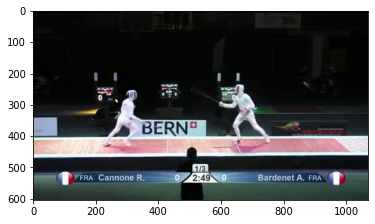

In [10]:
plt.imshow(img[:,:, ::-1])

In [15]:
first_box = [{'bbox':r_boxes[0][1]},{'bbox':boxes[0][1]},]
first_box

[{'bbox': [575, 216, 202, 217]}, {'bbox': [205, 238, 166, 205]}]

In [12]:
pose_model = init_pose_model(config, checkpoint=checkpnt)

load checkpoint from local path: .\pose_estimation\litehrnet30_coco_384x288-a3aef5c4_20210626.pth


In [16]:
res = inference_top_down_pose_model(
    pose_model,
    img,
    first_box,
    format='xywh',
    )[0]

In [4]:
strng = 'something.avi'
strng.rstrip('.avi')

'something'

In [80]:
data = res[0]['keypoints'].tolist()
json_str = json.dumps(data)
json_bytes = json_str.encode('utf-8')
with gzip.open('my_keypoints.json','w') as file:
    file.write(json.dumps(data).encode('utf-8'))
file.close()


In [81]:
with gzip.open('my_keypoints.json', 'r') as fin:
    json_bytes = fin.read()
json_str = json_bytes.decode('utf-8')
data = json.loads(json_str)
data


[[650.5746459960938, 256.9913024902344, 0.8556725978851318],
 [655.8350830078125, 253.484375, 0.8202528953552246],
 [650.5746459960938, 253.484375, 0.893267035484314],
 [666.3558959960938, 253.484375, 0.8864110708236694],
 [648.8211669921875, 253.484375, 0.8419687151908875],
 [682.1371459960938, 274.5260314941406, 0.9177468419075012],
 [647.0676879882812, 274.5260314941406, 0.9586169123649597],
 [703.1788330078125, 300.828125, 0.896565318107605],
 [640.0538330078125, 300.828125, 0.9016819000244141],
 [685.6441040039062, 309.5954895019531, 0.8026074171066284],
 [610.2448120117188, 300.828125, 0.8674544095993042],
 [690.904541015625, 327.1302185058594, 0.8623600006103516],
 [668.109375, 330.63714599609375, 0.8962051868438721],
 [710.1927490234375, 369.2135314941406, 0.8874791860580444],
 [645.314208984375, 365.7065734863281, 0.9086540341377258],
 [745.2621459960938, 402.5295104980469, 0.8382019400596619],
 [659.342041015625, 406.0364685058594, 0.8776336908340454]]

In [1]:
import torch

C:\Users\liamc\anaconda3\envs\fencing_v2\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [1]:
from detectron2.config import get_cfg

In [3]:
stng = "stuff_and_stuff-converted"
'converted' in stng:


False

In [2]:
first_box

NameError: name 'first_box' is not defined

In [52]:
vis_pose_result(pose_model, img, res, show=True)

array([[[ 3,  6,  4],
        [ 3,  6,  4],
        [ 3,  6,  4],
        ...,
        [ 3,  6,  4],
        [ 3,  6,  4],
        [ 3,  6,  4]],

       [[ 3,  6,  4],
        [ 3,  6,  4],
        [ 3,  6,  4],
        ...,
        [ 3,  6,  4],
        [ 3,  6,  4],
        [ 3,  6,  4]],

       [[ 3,  6,  4],
        [ 3,  6,  4],
        [ 3,  6,  4],
        ...,
        [ 3,  6,  4],
        [ 3,  6,  4],
        [ 3,  6,  4]],

       ...,

       [[39, 41, 34],
        [39, 41, 34],
        [39, 41, 34],
        ...,
        [44, 50, 31],
        [44, 50, 31],
        [44, 50, 31]],

       [[40, 42, 35],
        [40, 42, 35],
        [40, 42, 35],
        ...,
        [44, 50, 31],
        [44, 50, 31],
        [44, 50, 31]],

       [[41, 43, 36],
        [41, 43, 36],
        [41, 43, 36],
        ...,
        [44, 50, 31],
        [44, 50, 31],
        [44, 50, 31]]], dtype=uint8)

In [66]:
with gzip.open('my_file.json.gz', 'r') as f:
    read = f.read()

In [67]:
read

b''